Install necessary libraries and set up storage in Google Colab

In [ ]:
!pip install tensorflow_addons
!pip install tensorflow_datasets
!python -m pip install scipy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.2 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import sys
sys.path.insert(0,'/content/drive/My Drive/interpolation')

**Setup**

In [ ]:
import tensorflow as tf
import tensorflow_addons as tfa
import tensorflow_datasets as tfds
from tensorflow import keras
from keras import layers
from unet_clonable import *
from diffusion_model import *
import math
import numpy as np
import matplotlib.pyplot as plt

/usr/local/lib/python3.9/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.9.0 and strictly below 2.12.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.12.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


Set random seed for reproducibility

In [ ]:
tf.random.set_seed(1234)

**Prepare Diffusion Model**

In [ ]:
# architecture of attention unet
image_size = 64
widths = [32, 64, 96, 128]
block_depth = 2

# optimization
batch_size = 64
learning_rate = 1e-3
weight_decay = 1e-4

In [ ]:
# load dataset
#could setting in diffusion model.py
train_dataset_example ,train_dataset, info = prepare_dataset("train[:80%]+validation[:80%]+test[:80%]", with_info=True)
val_dataset = prepare_dataset("train[80%:]+validation[80%:]+test[80%:]")

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteWO6UXP/oxford_flowers102-test.tfrecord*.…

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteWO6UXP/oxford_flowers102-validation.tfre…

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.


**Dataset For Interpolation**

Take a small subset of images (5 images) to conduct interpolation

In [ ]:
valData = tfds.load("oxford_flowers102", split="train[80%:]+validation[80%:]+test[80%:]", shuffle_files=True).map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE).cache().repeat(5).shuffle(10).batch(5, drop_remainder=True).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
val_images = None
for image in valData.take(1):
  val_images = image

In [ ]:
val_images.shape

TensorShape([5, 64, 64, 3])

**Interpolation**

Interpolation with 500 diffusion steps

In [ ]:
diffusion_steps = 500
checkpoint_path = "/content/drive/My Drive/interpolation/trained_models/diffusion_steps_%d_chanel%d_attention_%d"%(diffusion_steps,max(widths),min(Attn_resolutions))

In [ ]:
diffuseModel = DiffusionModel(image_size, widths, block_depth, diffusion_steps=diffusion_steps)
diffuseModel.normalizer.adapt(train_dataset)
diffuseModel.compile(
    optimizer=tfa.optimizers.AdamW(
        learning_rate=learning_rate,
        weight_decay=weight_decay),
    loss=keras.losses.mean_absolute_error,  
)

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
# load the best model and generate images
diffuseModel.load_weights(checkpoint_path)

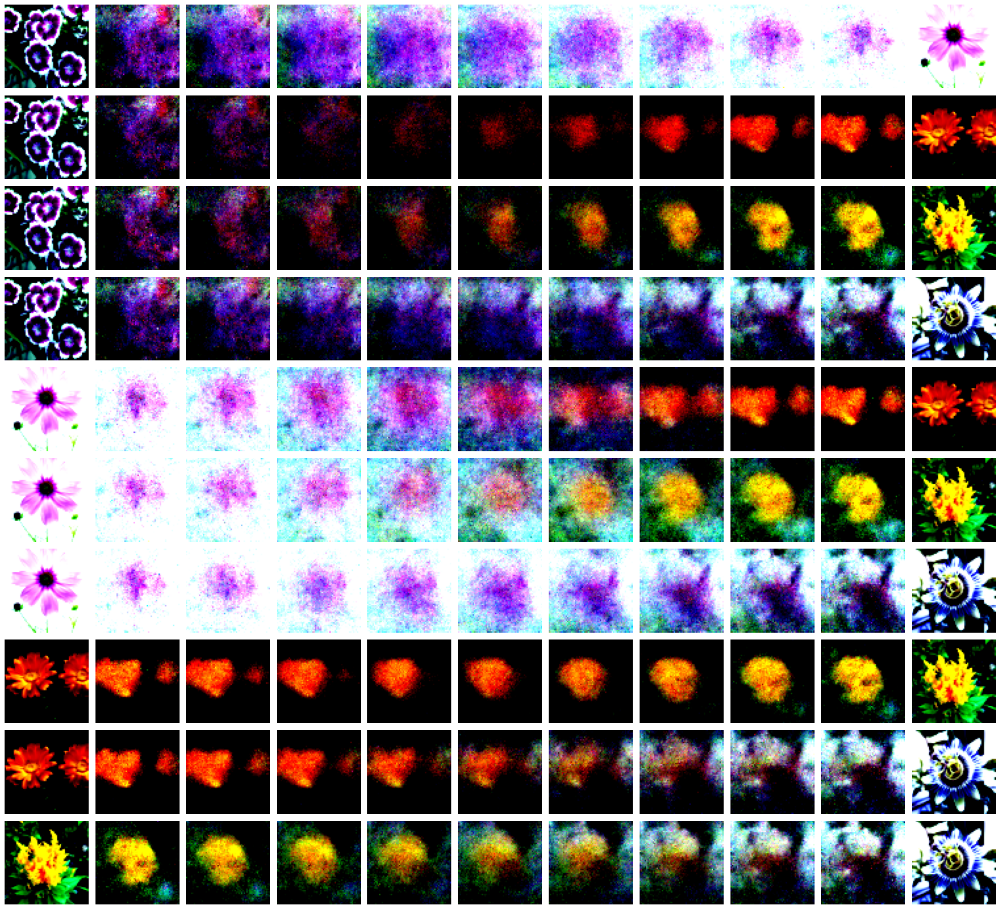

In [ ]:
diffuseModel.generateByInterpolation(val_images)

Interpolation with 1000 diffusion steps

In [ ]:
diffusion_steps2 = 1000
checkpoint_path2 = "/content/drive/My Drive/interpolation/trained_models/diffusion_steps_%d_chanel%d_attention_%d"%(diffusion_steps,max(widths),min(Attn_resolutions))

In [ ]:
diffuseModel2 = DiffusionModel(image_size, widths, block_depth, diffusion_steps=diffusion_steps2)
diffuseModel2.normalizer.adapt(train_dataset)
diffuseModel2.compile(
    optimizer=tfa.optimizers.AdamW(
        learning_rate=learning_rate,
        weight_decay=weight_decay),
    loss=keras.losses.mean_absolute_error,  
)

In [ ]:
# load the best model and generate images
diffuseModel2.load_weights(checkpoint_path2)

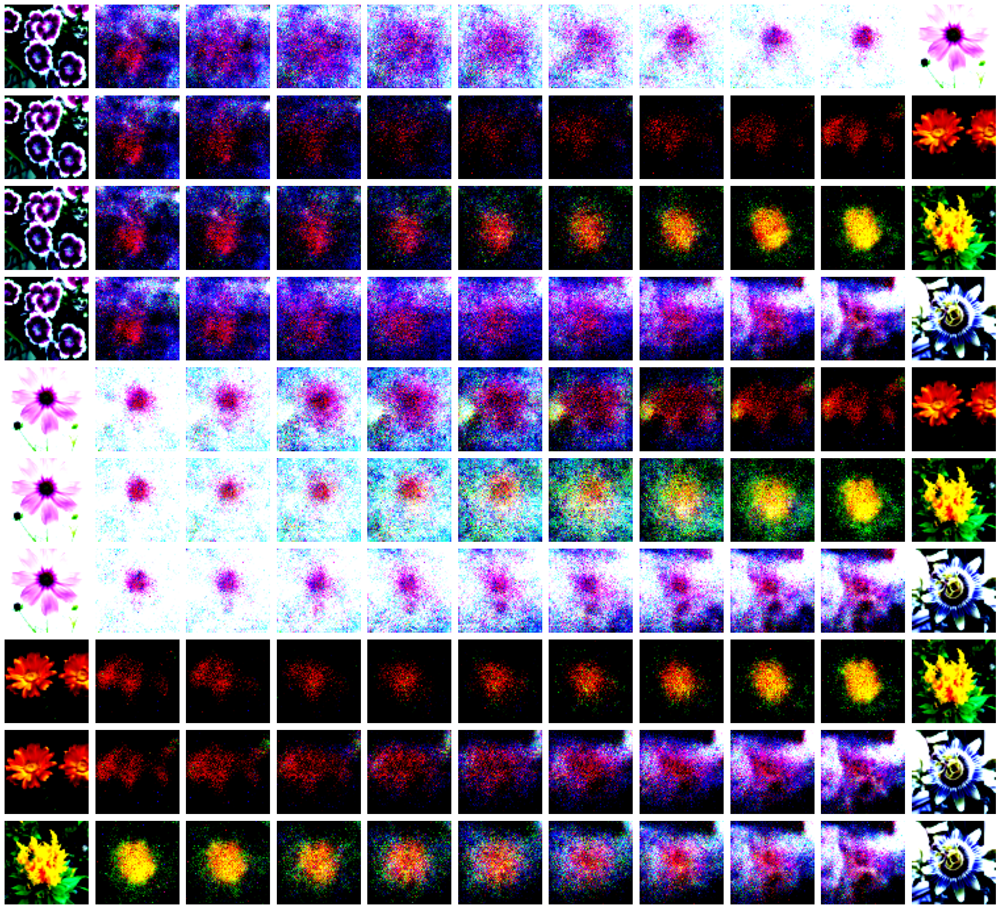

In [ ]:
diffuseModel2.generateByInterpolation(val_images)

Investigate Interpolation Trace

Take first 2 images

In [ ]:
val_images_first_2 = val_images[:2,]

In [ ]:
val_images_first_2.shape

TensorShape([2, 64, 64, 3])

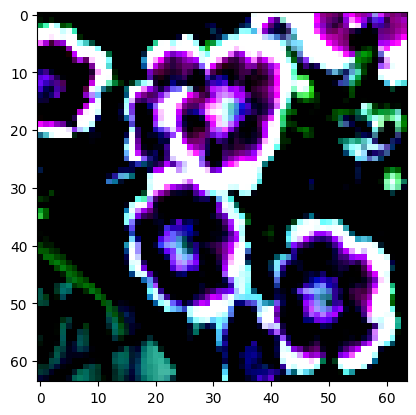

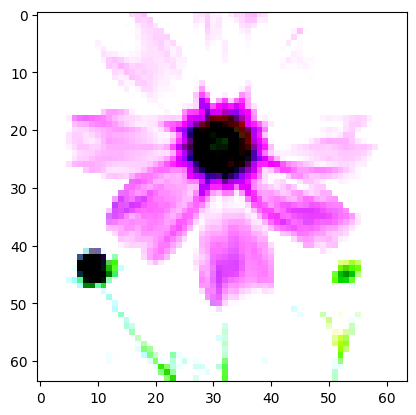

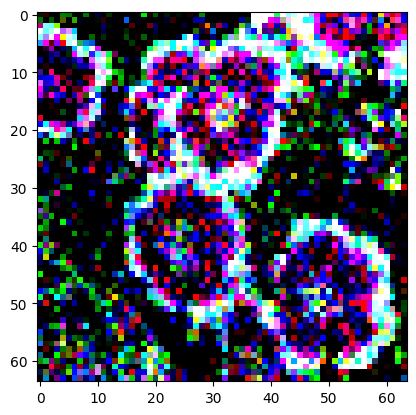

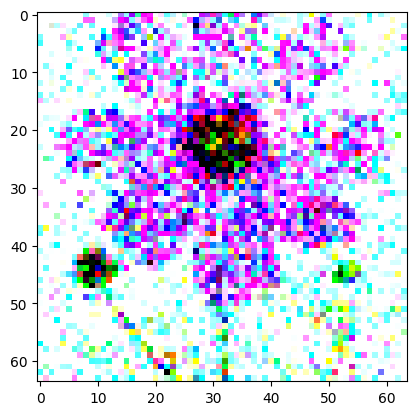

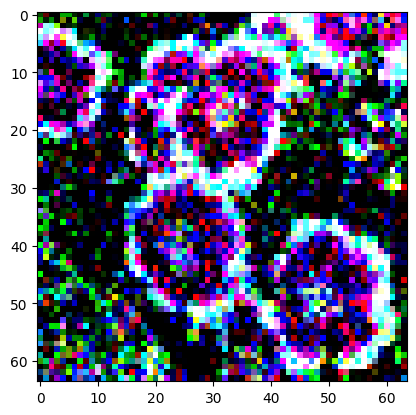

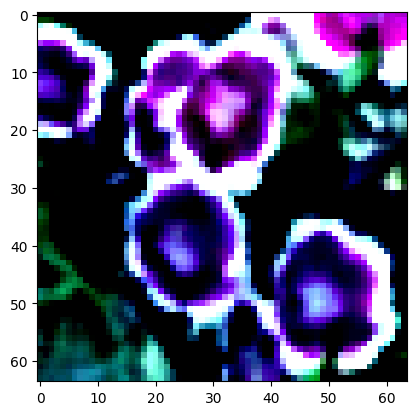

In [ ]:
diffuseModel.generateByInterpolation(val_images_first_2, trace=True)